# Exploratory Data Analysis

**`Goal`:** Look at differences across gender groups broken down by different job categories and confounders such as location, previous experience, etc. to determine what matching strategies might be highly valuable to adopt

### 1. Importing packages

In [ ]:
#Import visualization libraries
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#Data manipulation packages
import numpy as np
import pandas as pd

#Correlation
import phik
import scipy.stats

### 2. Loading the data

In [ ]:
df = pd.read_csv('../data/gender-annotated/cleaned-gender-annotated-v5.csv', low_memory=False)
df.head()

,search_query,name,gender,profile_link,location,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,...,skill_oracle_ebs_tech_integration,pct_certifications_google_webmaster_central_1,skill_modx,skill_cubecart,skill_phaser,skill_drilling_engineering,skill_casperjs,join_date_from_earliest,badge_preferred_freelancer,badge_verified
0,designer,Milen,male,https://www.freelancer.com/u/MsCaddServices,Edmonds,45,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7063,False,False
1,designer,Jeremy,male,https://www.freelancer.com/u/Conescu,Orinda,90,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7526,False,False
2,designer,Nichole,female,https://www.freelancer.com/u/NicholeMW,Holly,25,4.0,5.0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6430,False,False
3,designer,Robert,male,https://www.freelancer.com/u/rhoenig1277,Beloit,75,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3238,False,False
4,designer,Jean-Paul,male,https://www.freelancer.com/u/PaulCarriazo,Miami,19,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6661,False,False


### 3. Quick descriptive stats

In [ ]:
#Excluding skills and certifications
exclude_skill = df.loc[:,df.columns[:19]]
exclude_skill.describe()

,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,pct_jobs_completed,pct_on_budget,pct_on_time
count,9766.000000,9766.000000,9766.000000,9766.000000,9766.000000,1697.000000,1601.000000,1604.000000
mean,37.864018,0.570602,0.820459,2.713803,0.249027,97.634649,97.913179,97.354115
std,42.537802,1.459886,1.839297,24.927103,5.078355,8.113562,9.723777,10.957835
min,1.000000,0.000000,0.000000,0.000000,0.000000,29.000000,1.000000,1.000000
25%,20.000000,0.000000,0.000000,0.000000,0.000000,100.000000,100.000000,100.000000
50%,25.000000,0.000000,0.000000,0.000000,0.000000,100.000000,100.000000,100.000000
75%,45.000000,0.000000,0.000000,0.000000,0.000000,100.000000,100.000000,100.000000
max,900.000000,9.800000,5.000000,1076.000000,468.000000,100.000000,100.000000,100.000000


Based on most percentiles, we should probably be using the median rather than the mean or looking at the entire distribution

#### a. Gender proportions in our dataset

In [ ]:
display(df.gender.value_counts())

display(df.gender.value_counts(normalize=True))

male      6692
female    3074
Name: gender, dtype: int64

male      0.685234
female    0.314766
Name: gender, dtype: float64

More than twice as much males than females

### 4. Correlation across variables

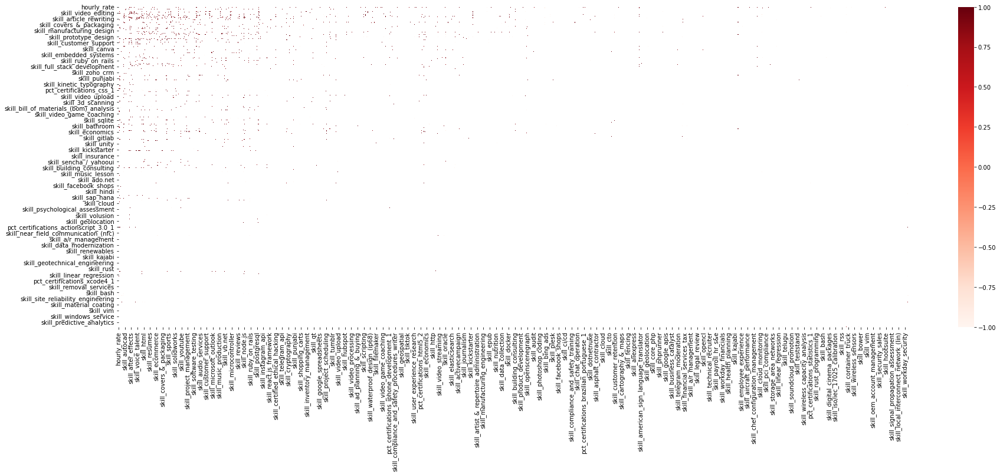

In [ ]:
# Create the correlation table (with pearson's r)
dfCorr = df.corr()
#Get highly correlated variables
filteredDf = dfCorr[((dfCorr >= .80) | (dfCorr <= -.80)) & (dfCorr !=1.000)]

#Plot correlation
plt.figure(figsize=(30,10))
sns.heatmap(filteredDf, cmap="Reds")
plt.show()

High correlation mostly between skills and certifications. A few between skills and hourly pay rate (meaning the more a freelancer had used a skill in projects, the higher the price they charged – could this also be driven by another underlying variable e.g. certifications?)

#### a. Dig deeper into variables with high correlation with varioius variables

**Hourly rate**

In [ ]:
hourly_rate_high_corr = dfCorr[abs(dfCorr['hourly_rate'])>0.75]['hourly_rate']
hourly_rate_high_corr

hourly_rate                                           1.000000
skill_gps                                             0.915100
skill_app_store_optimization                          0.780233
skill_amazon_fba                                      0.891443
pct_certifications_adobe_photoshop_cs4_1             -0.904534
skill_analog_/_mixed_signal_/_digital                 1.000000
pct_certifications_html_4_1                           0.849258
pct_certifications_french_to_english_translation_1    0.755929
pct_certifications_xhtml_1                            1.000000
pct_certifications_adobe_illustrator_cs4_1           -1.000000
skill_sculpturing                                     1.000000
pct_certifications_joomla!_1                          0.890743
skill_corporate_income_tax                            0.837300
pct_certifications_php_2                             -1.000000
pct_certifications_php_3                             -1.000000
pct_certifications_brazilian_portuguese_1            -1

Lot of these are probably just per chance. Let's look at skills or certifications in which these correlations were actually driven by a decent number of records

In [ ]:
for col in hourly_rate_high_corr.index:
    if df[col].count() > 15:
        print(f'{col}: {df[col].count()} records')

hourly_rate: 9766 records
skill_gps: 18 records
skill_corporate_income_tax: 21 records


Lol. Take results above with a pinch of salt then. Seems by chance

**Pay grade**

In [ ]:
pay_grade_high_corr = dfCorr[abs(dfCorr['pay_grade'])>0.75]['pay_grade']
pay_grade_high_corr

pay_grade                             1.000000
avg_rating                            0.847984
skill_amazon_fba                      1.000000
skill_simulation                      0.776451
skill_building                        0.854042
                                        ...   
pct_certifications_unix_2            -1.000000
skill_core_consulting_skills          1.000000
skill_abaqus                          1.000000
skill_netbeans                        0.818674
pct_certifications_c_programming_2    1.000000
Name: pay_grade, Length: 64, dtype: float64

In [ ]:
for col in pay_grade_high_corr.index:
    if df[col].count() > 20:
        print(f'{col}: {df[col].count()} records')

pay_grade: 9766 records
avg_rating: 9766 records
skill_simulation: 56 records
skill_building: 22 records
skill_training_development: 22 records
skill_adobe_xd: 29 records
skill_bank_reconciliation: 44 records


#### b. Success metrics and verifications

**Linear correlation (pearson's r)**

In [ ]:
#Excluding skill and certifications
pearson_corr_df = dfCorr.iloc[:14,:14]
pd.DataFrame(pearson_corr_df).style.background_gradient(cmap='coolwarm')

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/io/formats/style.py:1264: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(s.to_numpy()) if vmin is None else vmin
/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/io/formats/style.py:1265: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(s.to_numpy()) if vmax is None else vmax


,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,pct_jobs_completed,pct_on_budget,pct_on_time,verification_preferred_freelancer,verification_identity_verified,verification_payment_verified,verification_phone_verified,verification_email_verified,verification_facebook_connected
hourly_rate,1.000000,0.043048,0.013345,0.022282,0.118343,0.032187,0.059211,0.032039,0.062666,0.067560,0.036972,0.008501,nan,-0.010540
pay_grade,0.043048,1.000000,0.847984,0.433137,0.190947,0.000492,-0.057271,-0.102889,0.255672,0.342896,0.125444,0.147156,nan,0.001144
avg_rating,0.013345,0.847984,1.000000,0.241682,0.096195,-0.024275,0.168744,0.233639,0.158754,0.299518,0.133447,0.162158,nan,-0.001782
num_reviews,0.022282,0.433137,0.241682,1.000000,0.301698,-0.010824,-0.004576,-0.032981,0.149833,0.137979,0.021422,0.041552,nan,-0.008170
num_recommendations,0.118343,0.190947,0.096195,0.301698,1.000000,0.003859,0.000561,-0.011391,0.212513,0.072587,0.016740,0.021131,nan,0.010662
pct_jobs_completed,0.032187,0.000492,-0.024275,-0.010824,0.003859,1.000000,0.037213,0.088935,0.025213,-0.013780,0.080437,0.008853,nan,0.035440
pct_on_budget,0.059211,-0.057271,0.168744,-0.004576,0.000561,0.037213,1.000000,0.555344,-0.003328,-0.055128,-0.022433,-0.004547,nan,0.035746
pct_on_time,0.032039,-0.102889,0.233639,-0.032981,-0.011391,0.088935,0.555344,1.000000,-0.002671,-0.082906,0.015934,0.006126,nan,0.022011
verification_preferred_freelancer,0.062666,0.255672,0.158754,0.149833,0.212513,0.025213,-0.003328,-0.002671,1.000000,0.142487,0.050269,0.031446,nan,0.044605
verification_identity_verified,0.067560,0.342896,0.299518,0.137979,0.072587,-0.013780,-0.055128,-0.082906,0.142487,1.000000,0.175378,0.209614,nan,0.008956


**Strong positive correlation**
- avg_rating and pay_grade

**Weak positive correlation**
- num_reviews and pay_grade
- pct_budget and pct_on_time
- verification_identity_verified and pay_grade (0.3)
- verification_identity_verified and avg_rating (0.34)

**Phi_k correlation**

In [ ]:
#Excluding skill and certifications
phik_corr_df = df.iloc[:,5:19].phik_matrix()
pd.DataFrame(phik_corr_df).style.background_gradient(cmap='coolwarm')

interval columns not set, guessing: ['hourly_rate', 'pay_grade', 'avg_rating', 'num_reviews', 'num_recommendations', 'pct_jobs_completed', 'pct_on_budget', 'pct_on_time']
/root/venv/lib/python3.7/site-packages/phik/data_quality.py:84: UserWarning: Not enough unique value for variable verification_email_verified for analysis 1. Dropping this column
  col, df[col].nunique()


,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,pct_jobs_completed,pct_on_budget,pct_on_time,verification_preferred_freelancer,verification_identity_verified,verification_payment_verified,verification_phone_verified,verification_facebook_connected
hourly_rate,1.000000,0.109127,0.000000,0.020854,0.369121,0.284295,0.000000,0.000000,0.060177,0.043761,0.028881,0.041764,0.000000
pay_grade,0.109127,1.000000,0.623675,0.659389,0.649402,0.093361,0.000000,0.188737,0.447896,0.446021,0.174088,0.207438,0.000000
avg_rating,0.000000,0.623675,1.000000,0.106656,0.032165,0.206045,0.697468,0.609550,0.148411,0.280094,0.124819,0.150013,0.010592
num_reviews,0.020854,0.659389,0.106656,1.000000,0.696315,0.000000,0.097768,0.138121,0.267007,0.133943,0.031607,0.011023,0.037300
num_recommendations,0.369121,0.649402,0.032165,0.696315,1.000000,0.000000,0.000000,0.183044,0.099809,0.023166,0.000000,0.000000,0.007450
pct_jobs_completed,0.284295,0.093361,0.206045,0.000000,0.000000,1.000000,0.169887,0.346669,0.000000,0.000000,0.131756,0.086385,0.007799
pct_on_budget,0.000000,0.000000,0.697468,0.097768,0.000000,0.169887,1.000000,0.905465,0.000000,0.117370,0.075509,0.000000,0.050074
pct_on_time,0.000000,0.188737,0.609550,0.138121,0.183044,0.346669,0.905465,1.000000,0.036664,0.166400,0.078565,0.075864,0.070182
verification_preferred_freelancer,0.060177,0.447896,0.148411,0.267007,0.099809,0.000000,0.000000,0.036664,1.000000,0.218578,0.074872,0.043486,0.065780
verification_identity_verified,0.043761,0.446021,0.280094,0.133943,0.023166,0.000000,0.117370,0.166400,0.218578,1.000000,0.271183,0.322483,0.000000


*Correlation here does not necessarily mean linear correlation (see pearson k above for linear). Only that there is some pattern to the relationship between the variables (e.g. it could be non-linear)

**Strong correlation (emboldened means significant)**

- **avg_rating and pay_grade**
- **num_reviews and pay_grade**
- num_recommendations and pay_grade
- avg_rating and pct_on_budget
- avg_rating and pct_on_time
- **num_recommendations and num_reviews**
- **pct_on_budget and pct_on_time (0.90)**

**Weak correlation**
- hourly_rate and num_recommendations
- verification_preferred_freelancer and pay_grade (0.44)

In [ ]:
#Quick look at significance of the correlations
phik_sig_df = df.iloc[:,5:19].significance_matrix()
pd.DataFrame(phik_sig_df).style.background_gradient(cmap='Blues')

interval columns not set, guessing: ['hourly_rate', 'pay_grade', 'avg_rating', 'num_reviews', 'num_recommendations', 'pct_jobs_completed', 'pct_on_budget', 'pct_on_time']
/root/venv/lib/python3.7/site-packages/phik/data_quality.py:84: UserWarning: Not enough unique value for variable verification_email_verified for analysis 1. Dropping this column
  col, df[col].nunique()


,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,pct_jobs_completed,pct_on_budget,pct_on_time,verification_preferred_freelancer,verification_identity_verified,verification_payment_verified,verification_phone_verified,verification_facebook_connected
hourly_rate,71.223496,2.381079,0.323315,2.717384,3.607822,1.641574,-1.584346,-0.947029,3.308361,2.980168,1.846205,2.041339,-0.079339
pay_grade,2.381079,116.704125,81.654437,18.469133,6.793583,4.613654,1.982500,2.645927,15.561351,29.714744,12.631940,17.824265,-1.822622
avg_rating,0.323315,81.654437,96.263576,11.622017,3.270066,3.679105,4.240630,4.706252,12.990771,26.844319,12.947800,17.980694,0.721110
num_reviews,2.717384,18.469133,11.622017,25.980980,7.109092,0.068233,1.732534,2.470792,6.962115,7.682385,1.863270,1.784979,2.386620
num_recommendations,3.607822,6.793583,3.270066,7.109092,9.426947,0.897165,-0.614721,2.823623,4.696525,3.239873,0.475855,0.476619,1.490442
pct_jobs_completed,1.641574,4.613654,3.679105,0.068233,0.897165,36.273669,2.986966,5.298498,0.464174,0.145905,4.001761,1.256474,0.519290
pct_on_budget,-1.584346,1.982500,4.240630,1.732534,-0.614721,2.986966,29.978465,16.945582,-0.317805,2.452053,1.444155,0.634969,0.688067
pct_on_time,-0.947029,2.645927,4.706252,2.470792,2.823623,5.298498,16.945582,32.031849,0.646593,3.877296,1.106410,1.001381,1.476480
verification_preferred_freelancer,3.308361,15.561351,12.990771,6.962115,4.696525,0.464174,-0.317805,0.646593,24.446259,12.286148,5.451779,3.662703,4.145560
verification_identity_verified,2.980168,29.714744,26.844319,7.682385,3.239873,0.145905,2.452053,3.877296,12.286148,98.056300,17.842038,25.272083,0.363889


Summarizing from linear and phik correlation, there seems to be significant relationship between:
- **avg_rating and pay_grade**
- **num_reviews and pay_grade**
- **pct_on_buget and pct_on_time (0.90)**

#### c. Success metrics and badges

In [ ]:
#Fill badge NAs with False
df.loc[:,['badge_preferred_freelancer','badge_verified']] = df.loc[:,['badge_preferred_freelancer',
                                                                      'badge_verified']].fillna(False)

col_idx = [*range(5,13)]
badges_idx = list(np.argwhere(df.columns.str.contains('badge_')).flatten())
col_idx.extend(badges_idx)
col_idx

[5, 6, 7, 8, 9, 10, 11, 12, 53, 2264, 2265]

**Phik correlation**

In [ ]:
#Excluding skill and certifications
badges_corr_df = df.iloc[:,col_idx].phik_matrix()
pd.DataFrame(badges_corr_df.iloc[:,-3:]).style.background_gradient(cmap='coolwarm')

,badge_plus_membership,badge_preferred_freelancer,badge_verified
hourly_rate,0.038043,0.060177,0.060750
pay_grade,0.197312,0.447896,0.278670
avg_rating,0.116715,0.148411,0.120757
num_reviews,0.065052,0.267007,0.175986
num_recommendations,0.013851,0.099809,0.097828
pct_jobs_completed,0.014684,0.000000,0.107794
pct_on_budget,0.131426,0.000000,0.000000
pct_on_time,0.076063,0.036664,0.086589
badge_plus_membership,1.000000,0.191876,0.259150
badge_preferred_freelancer,0.191876,1.000000,0.497579


**Point biserial correlation**

Categorical and continuous variable correlation

In [ ]:
for badge in ['badge_plus_membership','badge_preferred_freelancer','badge_verified']:
    print(f"{badge}:", scipy.stats.pointbiserialr(df.pay_grade,df[badge]))

badge_plus_membership: PointbiserialrResult(correlation=0.14916773940227984, pvalue=1.0508663904878421e-49)
badge_preferred_freelancer: PointbiserialrResult(correlation=0.25567184598872544, pvalue=1.4663023047197785e-145)
badge_verified: PointbiserialrResult(correlation=0.17406896705486075, pvalue=2.6837112555242594e-67)


No correlation between badges and success/performance metrics.

#### d. Correlation between gender and success metrics?

In [ ]:
#Get position of gender
gender_idx = list(np.argwhere(df.columns == 'gender').flatten())

#Get success/performance metrics
gender_idx.extend(col_idx)

**Phik correlation**

In [ ]:
gender_success_df = df.iloc[:,gender_idx].phik_matrix()
pd.DataFrame(gender_success_df.iloc[:,0]).style.background_gradient(cmap='coolwarm')

,gender
gender,1.000000
hourly_rate,0.043211
pay_grade,0.079753
avg_rating,0.059334
num_reviews,0.028682
num_recommendations,0.007597
pct_jobs_completed,0.000000
pct_on_budget,0.030996
pct_on_time,0.000000
badge_plus_membership,0.000000


**Point biserial correlation**

In [ ]:
for succ_stat in ['hourly_rate', 'pay_grade', 'avg_rating', 'num_reviews','num_recommendations']:
    print(f"{succ_stat}:",scipy.stats.pointbiserialr(df[succ_stat],df.gender.map({'male':1,'female':0})))

hourly_rate: PointbiserialrResult(correlation=0.051564724167900186, pvalue=3.423119671140392e-07)
pay_grade: PointbiserialrResult(correlation=0.05618912248783188, pvalue=2.752993948835205e-08)
avg_rating: PointbiserialrResult(correlation=0.06468512914155677, pvalue=1.5715116832167376e-10)
num_reviews: PointbiserialrResult(correlation=0.024026312917474882, pvalue=0.01757783462730257)
num_recommendations: PointbiserialrResult(correlation=-0.004884096193187344, pvalue=0.6293780059422)


**Verdict**

Broadly it appears there is no correlation between gender and success metrics. This could change when we dissect the data by e.g. by occupation?

### 5. Checking if the search query categorizations seem to be accurate

In [ ]:
top_skill_cat_df = pd.read_csv('/work/DS4SG-Gender-Inequality/data/processed/winner_takes_all_v2.csv')
top_skill_cat_df.search_query = df.search_query
top_skill_cat_df.head()

,search_query,name,gender,join_date_from_earliest,location_size,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,...,marketing_business_skills,performance_arts_skills,design_skills,teaching_training_skills,miscellaneous_skills,language_certifications,freelancer_certifications,general_skill_certifications,programming_certifications,skill_category
0,designer,Milen,0,7063,1,45,0.0,0.0,0,0,...,0,0,8,0,1,0,0,0,0,design_skills
1,designer,Jeremy,0,7526,1,90,0.0,0.0,0,0,...,0,0,18,0,0,1,0,0,0,design_skills
2,designer,Nichole,1,6430,0,25,4.0,5.0,2,0,...,2,1,16,0,0,1,0,0,0,design_skills
3,designer,Robert,0,3238,1,75,0.0,0.0,0,0,...,0,0,5,0,0,0,1,0,0,technical_programming_skills
4,designer,Jean-Paul,0,6661,5,19,0.0,0.0,0,0,...,0,0,6,0,0,0,0,0,0,design_skills


In [ ]:
top_skill_cat_df.skill_category.value_counts()

design_skills                   3821
technical_programming_skills    3576
writing_skills                   959
marketing_business_skills        600
engineering_skills               417
finance_accounting_skills        258
language_translation_skills      135
Name: skill_category, dtype: int64

In [ ]:
df.search_query.value_counts()

designer             4357
software engineer    4292
copywriter            653
accountant            464
Name: search_query, dtype: int64

In [ ]:
df.iloc[top_skill_cat_df.query("skill_category == 'design_skills' ").index,:]

,search_query,name,gender,profile_link,location,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,...,skill_oracle_ebs_tech_integration,pct_certifications_google_webmaster_central_1,skill_modx,skill_cubecart,skill_phaser,skill_drilling_engineering,skill_casperjs,join_date_from_earliest,badge_preferred_freelancer,badge_verified
0,designer,Milen,male,https://www.freelancer.com/u/MsCaddServices,Edmonds,45,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7063,False,False
1,designer,Jeremy,male,https://www.freelancer.com/u/Conescu,Orinda,90,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7526,False,False
2,designer,Nichole,female,https://www.freelancer.com/u/NicholeMW,Holly,25,4.0,5.0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6430,False,False
4,designer,Jean-Paul,male,https://www.freelancer.com/u/PaulCarriazo,Miami,19,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6661,False,False
5,designer,Brianna,female,https://www.freelancer.com/u/btrump2m,Clemson,10,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6272,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,software engineer,Justin,male,https://www.freelancer.com/u/SpacePilotPro,United States,15,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5203,False,False
9751,software engineer,Enrique,male,https://www.freelancer.com/u/bulletirde,Mesa,35,4.8,5.0,7,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3813,False,False
9753,software engineer,Matthew,male,https://www.freelancer.com/u/Majaga,Titusville,2,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6669,False,False
9756,software engineer,William,male,https://www.freelancer.com/u/williamelliot,Jacksonville,55,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4326,False,False


#### a. Designer

In [ ]:
skill_subset_df = top_skill_cat_df.query("skill_category == 'design_skills' ")
display(skill_subset_df.search_query.value_counts())
display(skill_subset_df.search_query.value_counts(normalize=True))

designer             3010
software engineer     767
copywriter             33
accountant             11
Name: search_query, dtype: int64

designer             0.787752
software engineer    0.200733
copywriter           0.008636
accountant           0.002879
Name: search_query, dtype: float64

In [ ]:
3010/4357

0.6908423226991048

#### b. Accountant

In [ ]:
skill_subset_df = top_skill_cat_df.query("skill_category == 'finance_accounting_skills' ")
display(skill_subset_df.search_query.value_counts())
display(skill_subset_df.search_query.value_counts(normalize=True))

accountant           228
software engineer     27
designer               3
Name: search_query, dtype: int64

accountant           0.883721
software engineer    0.104651
designer             0.011628
Name: search_query, dtype: float64

In [ ]:
228/464

0.49137931034482757

#### c. Software engineer

In [ ]:
skill_subset_df = top_skill_cat_df.query("(skill_category == 'technical_programming_skills') or (skill_category == 'engineering_skills')")
display(skill_subset_df.search_query.value_counts())
display(skill_subset_df.search_query.value_counts(normalize=True))

software engineer    2943
designer              867
accountant            153
copywriter             30
Name: search_query, dtype: int64

software engineer    0.737040
designer             0.217130
accountant           0.038317
copywriter           0.007513
Name: search_query, dtype: float64

#### d. Copywriter

In [ ]:
skill_subset_df = top_skill_cat_df.query("skill_category == 'writing_skills' ")
display(skill_subset_df.search_query.value_counts())
display(skill_subset_df.search_query.value_counts(normalize=True))

copywriter           426
software engineer    288
designer             204
accountant            41
Name: search_query, dtype: int64

copywriter           0.444213
software engineer    0.300313
designer             0.212722
accountant           0.042753
Name: search_query, dtype: float64

In [ ]:
top_skill_cat_df.columns

Index(['search_query', 'name', 'gender', 'join_date_from_earliest',
       'location_size', 'hourly_rate', 'pay_grade', 'avg_rating',
       'num_reviews', 'num_recommendations', 'pct_jobs_completed',
       'pct_on_budget', 'pct_on_time', 'verification_preferred_freelancer',
       'verification_identity_verified', 'verification_payment_verified',
       'verification_phone_verified', 'verification_email_verified',
       'verification_facebook_connected', 'badge_plus_membership',
       'badge_preferred_freelancer', 'badge_verified', 'engineering_skills',
       'writing_skills', 'technical_programming_skills',
       'language_translation_skills', 'finance_accounting_skills',
       'management_skills', 'marketing_business_skills',
       'performance_arts_skills', 'design_skills', 'teaching_training_skills',
       'miscellaneous_skills', 'language_certifications',
       'freelancer_certifications', 'general_skill_certifications',
       'programming_certifications', 'skill_catego

### 6. Gender proportion across the different industries

In [ ]:
job_gend_count = df.groupby(['search_query','gender']).agg(count=('name','count')).reset_index()

fig = px.bar(job_gend_count, x="search_query", y="count", 
             color="gender", color_discrete_sequence=["blue", "purple"],
             text_auto=True, 
             category_orders={"gender": ["male", "female"]},
             barmode="group", labels={"search_query":'Occupation', "count":'Number of freelancers'})
fig.show()

Despite males doubling females in our dataset, we find that the counts for accountant and copywriter are pretty similar. Might be helpful to look at proportion of the data

In [ ]:
job_gend_count['gender_occupation_ratio'] = job_gend_count.groupby(['gender'])['count'].transform(lambda x: x/x.sum())

fig = px.bar(job_gend_count, x="gender", y="gender_occupation_ratio", 
             color="search_query", text_auto=True,
             category_orders={"gender": ["male", "female"]},
             labels={"search_query":'Occupation', 
             "gender":"Gender",
             "gender_occupation_ratio":'Percentage of freelancers'},
             width=1000, height=700)
             
fig.layout.yaxis.tickformat = ',.0%'

fig.show()

NameError: name 'job_gend_count' is not defined

In [ ]:
fig.data[0].line.color

A larger proportion of male freelancers were technically inclined (designer and software engineer) accounting for 92% of the male freelancer. Female Designer and software engineer freelancers accounted for 81% of the female freelancers in the dataset.

A higher proportion of female freelancers tended to be copywriters and accountants compared to male freelancers (even despite the huge sample size disparity)

In [ ]:
job_gend_count['occupation_gender_ratio'] = job_gend_count.groupby(['search_query'])['count'].transform(lambda x: x/x.sum())

fig = px.bar(job_gend_count, x="search_query", y="occupation_gender_ratio", 
             color="gender", color_discrete_sequence=["blue", "purple"], 
             text_auto=True,
             category_orders={"gender": ["male", "female"]},
             labels={"search_query":'Occupation',
             "occupation_gender_ratio":'Percentage of occupation'})

fig.layout.yaxis.tickformat = ',.0%'

fig.show()

### 5. Gender and success/performance metrics

#### a. Gender and job success report percentages (broadly)
Here we look at the broad gender difference before splitting by job

In [ ]:
#Get the pct_ metric columns
pct_metrics_with_gend = [col for col in df.columns if 'pct_' in col][:3]

#Add gender
pct_metrics_with_gend.append('gender')

#Melt df
pct_df = pd.melt(df.loc[:,pct_metrics_with_gend],['gender'],var_name='metric')

#Collapse melted variables using groupby and compute group mean pct
pct_df_melt = pct_df.groupby(['metric','gender']).agg(mean=('value','mean'),count=('value','count')).reset_index()

pct_df_melt.head()

,metric,gender,mean,count
0,pct_jobs_completed,female,98.350962,416
1,pct_jobs_completed,male,97.402030,1281
2,pct_on_budget,female,98.575377,398
3,pct_on_budget,male,97.694098,1203
4,pct_on_time,female,97.273183,399


In [ ]:
fig = px.bar(pct_df_melt, x="metric", y="mean", 
             color="gender", color_discrete_sequence=["blue", "purple"], hover_data=["mean", "count"],
             category_orders={"gender": ["male", "female"]},
             barmode="group", labels={"metric":'Metric', "mean":'Avg Percentage (%)'})
fig.show()

Roughly the same on average. Women who did complete jobs didn't appear to be frowned on more than mean in terms of timely and cost-congruent completion

In [ ]:
def plot_violin_with_points(df,x,y,
                            xaxis_title,
                            yaxis_title,
                            pointpos_male,
                            pointpos_female,
                            show_legend):

    """
    Function to plot grouped violin plot with scatter points
    """

    pointpos_male = pointpos_male 
    pointpos_female = pointpos_female 
    show_legend = show_legend

    fig = go.Figure()

    for i in range(0,len(pd.unique(df[x]))):
        fig.add_trace(go.Violin(x=df[x][(df['gender'] == 'male') &
                                (df[x] == pd.unique(df[x])[i])],

                                y=df[y][(df['gender'] == 'male')&
                                (df[x] == pd.unique(df[x])[i])],

                                legendgroup='M', scalegroup='M', name='male',
                                side='negative',
                                pointpos=pointpos_male[i], # where to position points
                                line_color='blue',
                                showlegend=show_legend[i])
                )
        fig.add_trace(go.Violin(x=df[x][(df['gender'] == 'female') &
                                (df[x] == pd.unique(df[x])[i])],

                                y=df[y][(df['gender'] == 'female')&
                                (df[x] == pd.unique(df[x])[i])],
                                legendgroup='F', scalegroup='F', name='female',
                                side='positive',
                                pointpos=pointpos_female[i],
                                line_color='purple',
                                showlegend=show_legend[i])
                )

    # update characteristics shared by all traces
    fig.update_traces(meanline_visible=True,
                    points='outliers', # show all points
                    jitter=0.05)
                    
    fig.update_layout(
        autosize=True,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        violingap=0, violingroupgap=0, violinmode='overlay')

    fig.show()


In [ ]:
pointpos_male = [-0.6,-0.3,-0.4]
pointpos_female = [0.4,0.3,0.2]
show_legend = [True,False,False]

plot_violin_with_points(pct_df,'metric','value','Metric','Percentage (%)',pointpos_male,
                        pointpos_female, show_legend)

Looking at averages, its roughly similar across both genders. When we consider outliers

#### b. Gender, average rating, and pay grade
We only look at people who have been reviewed (for average rating) and people who have attempted a job (for pay grade)

In [ ]:
#Get people who have completed jobs for comparing pay grade
pay_grade_df = df[df.pct_jobs_completed.notnull()]

#Get people who have been reviewed for comparing average rating
reviewed_df = df[df.num_reviews > 0]

for df, metric, axis_title in [(pay_grade_df, 'pay_grade','Pay grade (out of 10)'),
                               (reviewed_df, 'avg_rating','Average Rating (out of 5)')]:

    fig = px.violin(df, x='gender', y=metric, color='gender',
                    color_discrete_sequence=["blue", "purple"],
                    category_orders={"gender": ["male", "female"]},
                    labels = {'gender':'Gender', metric:axis_title})

    fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

    fig.show()

- Average rating pretty much the same
- Pay grade pretty much the same (i.e. men and women seem to earn similarly). However, we note that pay grade doesn't easily allow us distinguish between the absolute earnings. Female median is even a bit higher

#### c. Number of reviews

In [ ]:
fig = px.violin(df, x='gender', y='num_reviews', color='gender',
                    color_discrete_sequence=["blue", "purple"],
                    category_orders={"gender": ["male", "female"]},
                    labels = {'gender':'Gender', 'num_reviews':'Number of reviews'})

fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

fig.show()

Men get 70% more reviews than women, on average, but this is likely due to strong outliers. We must remember that the dataset contains almost twice as many men. More observations -> the higher the chance of capturing outliers

#### d. Number of recommendations

In [ ]:
fig = px.violin(df, x='gender', y='num_recommendations', color='gender',
                    color_discrete_sequence=["blue", "purple"],
                    category_orders={"gender": ["male", "female"]},
                    labels = {'gender':'Gender', 'num_recommendations':'Number of recommendations'})

fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

fig.show()

Take away the outlier could it be that men have on average more recommendations. But we must remember that the dataset contains almost twice as many men. More observations -> the higher the chance of capturing outliers

### 5. Industry average rating and pay grade for male vs. female

#### a. Pay grade
We only look at people who have been have attempted a job (I believe)

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(pay_grade_df,'search_query','pay_grade','Occupation',
                        'Pay grade (out of 10)',pointpos_male, pointpos_female, 
                        show_legend)

Despite more women (and a higher proportion of women freelancers) being accountants, male accountants seem to earn more on average than women. 

#### b. Average rating

We only look at people who have been reviewed

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(reviewed_df,'search_query','avg_rating','Occupation',
                        'Average rating (out of 5)',pointpos_male, pointpos_female, 
                        show_legend)

##### Mean average rating

In [ ]:
mean_reviewed_df = reviewed_df.groupby(['search_query','gender']).agg(occupation_avg_rating = ('avg_rating',np.mean)).reset_index()

fig = px.bar(mean_reviewed_df, x="search_query", y="occupation_avg_rating", 
             color="gender", color_discrete_sequence=["blue", "purple"], 
             category_orders={"gender": ["male", "female"]},
             barmode="group", labels={'search_query':'Occupation', 
             'occupation_avg_rating':'Occupation average rating (out of 5)'})
fig.show()


#### c. Number of reviews
Likely correlated with pay grade but let us see regardless

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(df,'search_query','num_reviews','Occupation',
                        'Number of reviews',pointpos_male, pointpos_female, 
                        show_legend)

Differences in copywriter (mean: 23.83 vs 14) and accountant (mean: 20.46 vs. 9.4). Favouring men.

Accountant more than double. And not even really due to numerous outliers (see median and q3)

#### d. Number of recommendations

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(df,'search_query','num_recommendations','Occupation',
                        'Number of recommendations',pointpos_male, pointpos_female, 
                        show_legend)

#### e. Why do male accountants seemingly do better?

##### Number of skills listed?
Assumes a bulk of their listed skills will be accountancy related

In [ ]:
#Get accountants
male_accountant_df = df.query("(search_query == 'accountant') & (gender == 'male')")
female_accountant_df = df.query("(search_query == 'accountant') & (gender == 'female')")

skill_cols = [col for col in df.columns if 'skill_' in col]

print('MEAN')
print(f"Average number of skills for male: {male_accountant_df.loc[:,skill_cols].count(axis=1).mean()}")
print(f"Average number of skills for female: {female_accountant_df.loc[:,skill_cols].count(axis=1).mean()}")

print('\nMEDIAN')
print(f"Median number of skills for male: {np.median(male_accountant_df.loc[:,skill_cols].count(axis=1))}")
print(f"Median number of skills for female: {np.median(female_accountant_df.loc[:,skill_cols].count(axis=1))}")


MEAN
Average number of skills for male: 11.806306306306306
Average number of skills for female: 11.458677685950413

MEDIAN
Median number of skills for male: 11.0
Median number of skills for female: 11.0


Not really different

##### Number of certifications listed?
Assumes a bulk of their listed certifications will be accountancy related

In [ ]:
cert_cols = [col for col in df.columns if 'pct_certifications_' in col]

print('MEAN')
print(f"Average number of certifications for male: {male_accountant_df.loc[:,cert_cols].count(axis=1).mean()}")
print(f"Average number of certifications for female: {female_accountant_df.loc[:,cert_cols].count(axis=1).mean()}")

print('\nMEDIAN')
print(f"Median number of certifications for male: {np.median(male_accountant_df.loc[:,cert_cols].count(axis=1))}")
print(f"Median number of certifications for female: {np.median(female_accountant_df.loc[:,cert_cols].count(axis=1))}")


MEAN
Average number of certifications for male: 0.14864864864864866
Average number of certifications for female: 0.12396694214876033

MEDIAN
Median number of certifications for male: 0.0
Median number of certifications for female: 0.0


### 6. Hourly rates exploration

**`To do:`** Check statistical significance? But we know there are confounders. Any point?

#### a. Hourly rates by gender broadly

In [ ]:
fig = px.violin(df, x='gender', y="hourly_rate", color='gender',
                color_discrete_sequence=["blue", "purple"], 
                category_orders={"gender": ["male", "female"]},
                labels = {'gender':'Gender', 'hourly_rate':'Hourly rate ($)'})

fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

#fig.update_layout(template='simple_white')

fig.show()

- Ignoring occupation, males, on average (and in median terms), charge higher per hour, than females
    - Male avg = 39.35, Male median = 30
    - Female avg = 34.62, Female median = 25

- This difference seems to be driven by the software engineering career

#### b. Hourly rate by gender grouped by job category

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(df,'search_query','hourly_rate','Occupation','Hourly rate ($)',pointpos_male,
                        pointpos_female, show_legend)

Across a lot of occupations however (except software engineering), males and females appear to charge roughly the same hourly rate, on average.

- Software engineer
    - Male
        - Mean: $43.23
        - Median: $30
    - Female
        - Mean: $35.38
        - Median: $25

- Copywriting
    - Male
        - Mean: $40.14 (Driven by outliers)
        - Median: $25
    - Female
        - Mean: $35.57
        - Median: $30

#### c. Median hourly pay by skill

In [ ]:
#Dictionary to store skills and their median pays
skill_med_pay = {'skill':[], 'record_count':[],'median_hourly_rate':[]}

#Get all the skills in the dataframe
skills = [col for col in df.columns if 'skill_' in col]

#Iterate through each skill and compute the average hourly rate
for skill in skills:
    skill_med_pay['skill'].append(skill.replace('skill_','').replace('_',' '))
    skill_med_pay['record_count'].append(df[skill].notnull().sum())
    skill_med_pay['median_hourly_rate'].append(np.median(df.loc[df[skill].notnull(),'hourly_rate']))

#Make pandas dataframe
skill_med_pay_df = pd.DataFrame(skill_med_pay) 

#Rearrange dataframe from highest to lowest
skill_med_pay_df = skill_med_pay_df.sort_values('median_hourly_rate',ascending=False).reset_index(drop=True)

#Get top 10 that have at least 20 individuals with the skill
top_10 = skill_med_pay_df.query("record_count >= 20")[:10]

/shared-libs/python3.7/py/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/shared-libs/python3.7/py/lib/python3.7/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  from ipykernel import kernelapp as app


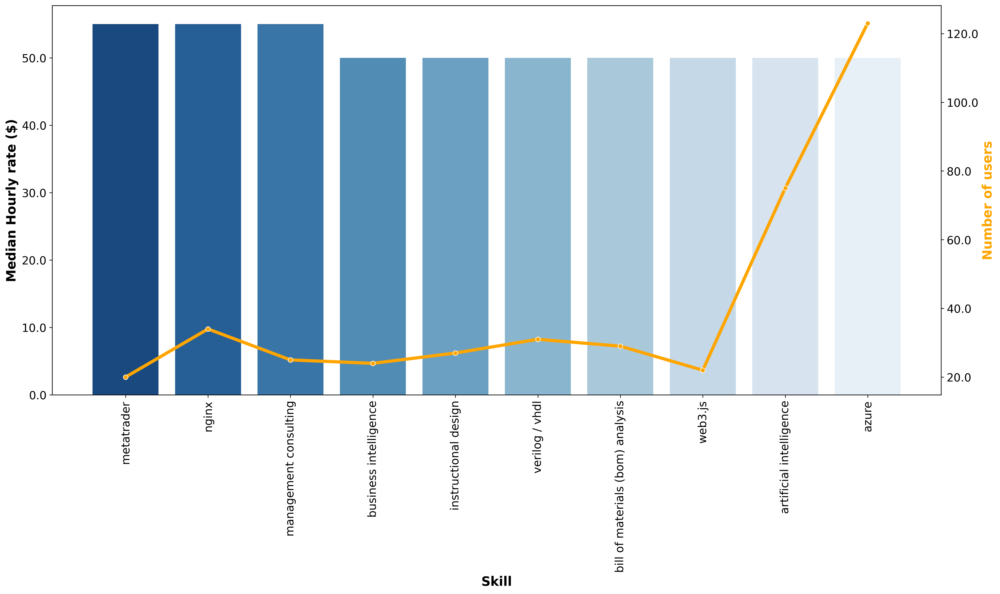

In [ ]:
plt.figure(figsize=(20,9), dpi=300)

palette = sns.color_palette("Blues",10)
palette.reverse()

ax1 = sns.barplot(data=top_10, x='skill', y= 'median_hourly_rate', palette = palette, ci=None)
ax2 = plt.twinx(ax1)
sns.lineplot(data = top_10, x='skill', y='record_count',ax=ax2, color='orange',linewidth=4,marker="o")

ax1.set_ylabel('Median Hourly rate ($)',fontsize=16, fontweight= 'bold')
ax2.set_ylabel('Number of users',fontsize=16, fontweight= 'bold',color='orange')
ax1.set_xlabel('Skill',fontsize=16, fontweight= 'bold')
ax1.set_xticklabels(ax1.get_xticklabels(), fontsize = 14, rotation = 90)
ax1.set_yticklabels(ax1.get_yticks(), fontsize = 14) 
ax2.set_yticklabels(ax2.get_yticks(), fontsize = 14) 

# ax.bar_label(ax.containers[0], 
#                 labels = [str(int(x))+'\nrecords' for x in top_10.record_count], 
#                 label_type='center', 
#                 fontweight='semibold', fontsize = 12)

plt.show()

Lots of tech

#### d. Median hourly pay by skill grouped by gender

In [ ]:
#Dictionary to store skills, gender, and their median pays
skill_med_gend_pay = {'skill':[], 'record_count':[], 'gender':[], 'median_hourly_rate':[]}

#Get all the skills in the dataframe
skills = [col for col in df.columns if 'skill_' in col]

#Iterate through each skill and compute the average hourly rate
for skill in skills:

    for gender in ['male','female']:

        #Add the skill in focus to the dataframe
        skill_med_gend_pay['skill'].append(skill.replace('skill_','').replace('_',' '))

        #Gender records
        gend_series = df.loc[(df.gender == gender) & (df[skill].notnull()),'hourly_rate']

        #Get count
        skill_med_gend_pay['record_count'].append(gend_series.count())

        #Note gender
        skill_med_gend_pay['gender'].append(gender)

        #Get median
        skill_med_gend_pay['median_hourly_rate'].append(np.median(gend_series))

#Make pandas dataframe
skill_med_gend_pay_df = pd.DataFrame(skill_med_gend_pay) 

/shared-libs/python3.7/py/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/shared-libs/python3.7/py/lib/python3.7/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
#Calculate pct_difference
skill_med_gend_pay_df['pct_diff'] = skill_med_gend_pay_df.groupby(['skill'])[['median_hourly_rate']].pct_change()

#Get absolute pct_diff
skill_med_gend_pay_df['abs_pct_diff'] = abs(skill_med_gend_pay_df['pct_diff'])

#Note the pct difference across each gender group – If positive male has higher median hourly rate
skill_med_gend_pay_df["grp_pct_diff"] = skill_med_gend_pay_df.groupby(['skill'])[["pct_diff"]].transform(sum)

#Note the absolute pct difference across each gender group
skill_med_gend_pay_df["grp_abs_pct_diff"] = skill_med_gend_pay_df.groupby(['skill'])[["abs_pct_diff"]].transform(sum)

#Calculate total records by skill
skill_med_gend_pay_df["total_records"] = skill_med_gend_pay_df.groupby(['skill'])[["record_count"]].transform(sum)

skill_med_gend_pay_df.head()


,skill,record_count,gender,median_hourly_rate,pct_diff,abs_pct_diff,grp_pct_diff,grp_abs_pct_diff,total_records
0,engineering,514,male,35.0,NaN,NaN,-0.285714,0.285714,587
1,engineering,73,female,25.0,-0.285714,0.285714,-0.285714,0.285714,587
2,building architecture,188,male,29.5,NaN,NaN,-0.152542,0.152542,263
3,building architecture,75,female,25.0,-0.152542,0.152542,-0.152542,0.152542,263
4,3d rendering,425,male,28.0,NaN,NaN,-0.107143,0.107143,559


**i. Show top 10 by skill median_hourly_rate (where skill record total >=20)**

In [ ]:
#Get top 10 skills from previos run
top_10_gend_pay = skill_med_gend_pay_df.query("skill in @top_10.skill")

#Reorder based on overall hourly_rate
top_10_gend_pay['skill'] = pd.Categorical(top_10_gend_pay['skill'], categories=top_10.skill, ordered=True)
top_10_gend_pay = top_10_gend_pay.sort_values('skill')

fig = px.bar(top_10_gend_pay, x="skill", y="median_hourly_rate", 
             hover_data=["record_count"],
             text="record_count",
             color="gender", color_discrete_sequence=["blue", "purple"], 
             category_orders={"gender": ["male", "female"]},
             barmode="group", labels={'skill':'Skill', 'median_hourly_rate':'Median hourly rate ($)'})
fig.show()

~Men seem to charge higher, on average, for the skills with the highest average hourly rates (again: we only look at skills with at least 20 records)~

Women seem to charge higher or at least competitively for the tech skills and other skills with higher hourly rates (again: we only look at skills with at least 20 records). However, it is important to consider the sample size! – Hover over to see

**ii. Show top 10 by max pct_diff**

In [ ]:
#Order by pct_diff
skill_med_gend_pay_diff_sorted = skill_med_gend_pay_df.sort_values("grp_abs_pct_diff", ascending=False)

#Get only skills with at least 20 records – not optimal way – REVISTTTT
num_top_skills = 10 #to be multiplied by 2 
skill_pct_diff_top_10 = skill_med_gend_pay_diff_sorted.query("total_records >= 20")[:(num_top_skills*2)]

In [ ]:
## calculate percentage change of an animal from SF to LA
pct_change = [100*diff for diff in top_10_gend_pay.pct_diff if not np.isnan(diff)]

male_df = top_10_gend_pay.query("gender=='male'")
female_df = top_10_gend_pay.query("gender=='female'")

## pass the text to the second graph_object only
fig = go.Figure(data=[
    go.Bar(name='male', x = male_df.skill, y = male_df.median_hourly_rate,marker_color='blue'),
    go.Bar(name='female' , x = female_df.skill, y = female_df.median_hourly_rate,
           marker_color='purple',
           text=[f"+{percent_change:.0f}%" if percent_change > 0 else f"{percent_change:.0f}%" 
                 for percent_change in pct_change],
           textposition='outside',
           textfont_size=18,
           textfont={"color": ["green" if diff > 0 else "red" for diff in pct_change]}
        )
])

# Change the bar mode
fig.update_layout(barmode='group',
                  yaxis=dict(title='Median hourly rate ($)',
                  titlefont_size=16,
                  tickfont_size=12),
                  xaxis=dict(title='Skill',
                  titlefont_size=16,
                  tickfont_size=12)
)
fig.show()


**Skills where women earn more than men**

In [ ]:
#Order by pct_diff – and where females earn significantly more
skill_med_gend_pay_female_sorted = skill_med_gend_pay_df.sort_values("grp_abs_pct_diff", ascending=False)

#Get only skills with at least 20 records – not optimal way – REVISTTTT
num_top_skills = 10 #to be multiplied by 2 
skill_pct_diff_female_top_10 = skill_med_gend_pay_female_sorted.query("total_records >= 20")[:(num_top_skills*2)]

In [ ]:
## calculate percentage change
pct_change = [100*diff for diff in skill_pct_diff_female_top_10.pct_diff if not np.isnan(diff)]

male_df = skill_pct_diff_female_top_10.query("gender=='male'")
female_df = skill_pct_diff_female_top_10.query("gender=='female'")

## pass the text to the second graph_object only
fig = go.Figure(data=[
    go.Bar(name='male', x = male_df.skill, y = male_df.median_hourly_rate,marker_color='blue',
    text = male_df.record_count),
    go.Bar(name='female' , x = female_df.skill, y = female_df.median_hourly_rate,
           marker_color='purple',
           text = female_df.record_count
            # text=[f"+{percent_change:.0f}%" if percent_change > 0 else f"{percent_change:.0f}%" 
            #         for percent_change in pct_change],
            # textposition='outside',
            # textfont_size=18,
            # textfont={"color": ["green" if diff > 0 else "red" for diff in pct_change]}
        )
])

# Change the bar mode
fig.update_layout(barmode='group',
                  yaxis=dict(title='Median hourly rate ($)',
                  titlefont_size=16,
                  tickfont_size=12),
                  xaxis=dict(title='Skill',
                  titlefont_size=16,
                  tickfont_size=12)
)

x_pos = 0.2
for idx, y_pos in enumerate(female_df.median_hourly_rate.values):
    diff = pct_change[idx]
    fig.add_annotation(x=x_pos, y=y_pos+6,
                text=f"+{diff:.0f}%" if diff > 0 else f"{diff:.0f}%",
                showarrow=False,
                font=dict(size=9,color=f"green" if diff > 0 else f"red")
                )
    x_pos += 1

fig.show()


In [ ]:
fig = px.bar(skill_pct_diff_top_10, x="skill", y="median_hourly_rate", 
             hover_data=["record_count"],
             color="gender", color_discrete_sequence=["purple","blue"], 
             category_orders={"gender": ["female", "male"]},
             barmode="group", labels={'skill':'Skill', 'median_hourly_rate':'Median hourly rate ($)'})
fig.show()

A lot of language, writing, and research skills

For skills with the largest difference in gender pay, women seem to charge significantly higher than men

**SAMPLE SIZE FOR MALE & FEMALE IS IMPORTANT TO CONSIDER! – HOVER TO SEE** 


Is this the case on average across all skills? : No (see below)

In [ ]:
skill_avg_gend_pay_diff_sorted.groupby('gender').avg_hourly_rate.agg([np.mean,np.std])

,mean,std
gender,,
female,40.359677,29.921698
male,42.696774,24.238717


**Show top 10 skills where pct_difference in hourly rates is in favour of women**

In [ ]:
skill_med_gend_pay_df

,skill,record_count,gender,median_hourly_rate,pct_diff,abs_pct_diff,grp_pct_diff,grp_abs_pct_diff,total_records
0,engineering,514,male,35.0,NaN,NaN,-0.285714,0.285714,587
1,engineering,73,female,25.0,-0.285714,0.285714,-0.285714,0.285714,587
2,building architecture,188,male,29.5,NaN,NaN,-0.152542,0.152542,263
3,building architecture,75,female,25.0,-0.152542,0.152542,-0.152542,0.152542,263
4,3d rendering,425,male,28.0,NaN,NaN,-0.107143,0.107143,559
...,...,...,...,...,...,...,...,...,...
4241,phaser,0,female,NaN,0.000000,0.000000,0.000000,0.000000,1
4242,drilling engineering,0,male,NaN,NaN,NaN,0.000000,0.000000,0
4243,drilling engineering,0,female,NaN,NaN,NaN,0.000000,0.000000,0
4244,casperjs,1,male,25.0,NaN,NaN,0.000000,0.000000,1


In [ ]:
#Order by pct_diff
skill_med_gend_pay_female = skill_med_gend_pay_df.sort_values("pct_diff", ascending=False)

#Get only skills with at least 20 records – not optimal way – REVISTTTT
num_top_skills = 10 #to be multiplied by 2 
skill_pct_diff_top_10 = skill_med_gend_pay_diff_sorted.query("total_records >= 20")[:(num_top_skills*2)]

**iii. Show top 10 skills where pct_difference in hourly rates is in favour of man**


The case for women is the above

In [ ]:
#Order by pct_diff
skill_med_gend_pay_male = skill_med_gend_pay_df.sort_values("grp_pct_diff")

#Get only skills with at least 20 records – not optimal way – REVISTTTT
num_top_skills = 10 #to be multiplied by 2 
male_pct_diff_top_10 = skill_med_gend_pay_male.query("total_records >= 20")[:(num_top_skills*2)]

In [ ]:
## calculate percentage change
pct_change = [100*diff for diff in male_pct_diff_top_10.pct_diff if not np.isnan(diff)]

male_df = male_pct_diff_top_10.query("gender=='male'")
female_df = male_pct_diff_top_10.query("gender=='female'")

## pass the text to the second graph_object only
fig = go.Figure(data=[
    go.Bar(name='male', x = male_df.skill, y = male_df.median_hourly_rate,marker_color='blue',
    text = male_df.record_count),
    go.Bar(name='female' , x = female_df.skill, y = female_df.median_hourly_rate,
           marker_color='purple',
           text = female_df.record_count
        )
])

# Change the bar mode
fig.update_layout(barmode='group',
                  yaxis=dict(title='Median hourly rate ($)',
                  titlefont_size=16,
                  tickfont_size=12),
                  xaxis=dict(title='Skill',
                  titlefont_size=16,
                  tickfont_size=12)
)

x_pos = 0.2
for idx, y_pos in enumerate(female_df.median_hourly_rate.values):
    diff = pct_change[idx]
    fig.add_annotation(x=x_pos, y=y_pos+2,
                text=f"+{diff:.0f}%" if diff > 0 else f"{diff:.0f}%",
                showarrow=False,
                font=dict(size=8,color=f"green" if diff > 0 else f"red")
                )
    x_pos += 1

fig.show()


In [ ]:
fig = px.bar(male_pct_diff_top_10, x="skill", y="median_hourly_rate",
             hover_data=["record_count"], 
             color="gender", color_discrete_sequence=["blue", "purple"],
             category_orders={"gender": ["male","female"]}, 
             barmode="group", labels={'skill':'Skill', 'median_hourly_rate':'Avg hourly rate ($)'})
fig.show()

A lot of programming skills

**AGAIN SAMPLE SIZE IS IMPORTANT TO CONSIDER!**

There are just significantly more men with these skills tagged on their profile than women

### 7. Gender and pay grade across industries
Not just looking at people who have attempted a job (as was done above)

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(df,'search_query','pay_grade','Occupation','Pay Grade (out of 10)',pointpos_male,
                        pointpos_female, show_legend)

### 8. Gender & Certifications

In [ ]:
#Get the certification columns
certification_cols = [col for col in df.columns if 'certification' in col]

#Count number of certifications
gend_certifications_df = df.copy()
gend_certifications_df['num_certifications'] = df.loc[:,certification_cols].notnull().sum(axis=1)

#Subset the data
gend_certifications_df = gend_certifications_df.loc[:,['search_query','gender','num_certifications']]

In [ ]:
fig = px.violin(gend_certifications_df, x='gender', y='num_certifications', color='gender',
                    color_discrete_sequence=["blue", "purple"],
                    category_orders={"gender": ["male", "female"]},
                    labels = {'gender':'Gender', 'num_certifications':'Number of certifications'})

fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

fig.show()

In [ ]:
pointpos_male = [-0.6,-0.6,-0.6,-0.3]
pointpos_female = [0.45,0.55,0.6,0.4]
show_legend = [True,False,False,False]

plot_violin_with_points(gend_certifications_df,'search_query','num_certifications','Occupation',
                        'Number of certifications',pointpos_male, pointpos_female, 
                        show_legend)

Not really a difference. Except maybe in software engineering

### 9. Missingness/Nullity Analysis

In [ ]:
#Get gender with success metrics
gend_with_succ_metrics = df.iloc[:,[0,2] + [*range(5,19)]]

#### a. pct_{variable}

In [ ]:
for var in ['pct_jobs_completed','pct_on_budget','pct_on_time']:

    print(var.upper())

    #Get gender of people with missing variable
    missing_var = gend_with_succ_metrics[gend_with_succ_metrics[var].isna()].gender

    display(missing_var.value_counts())

    display(missing_var.value_counts(normalize=True))

PCT_JOBS_COMPLETED


male      5411
female    2658
Name: gender, dtype: int64

male      0.670591
female    0.329409
Name: gender, dtype: float64

PCT_ON_BUDGET


male      5489
female    2676
Name: gender, dtype: int64

male      0.67226
female    0.32774
Name: gender, dtype: float64

PCT_ON_TIME


male      5487
female    2675
Name: gender, dtype: int64

male      0.672262
female    0.327738
Name: gender, dtype: float64

##### What proportion of the total number of men & women had no jobs completed

In [ ]:
#Get gender of people with missing pct job completed
missing_job_complete = gend_with_succ_metrics[gend_with_succ_metrics['pct_jobs_completed'].isna()].gender

print(f"% of male with no job completed: {missing_job_complete.value_counts()['male']/df.gender.value_counts()['male']}")
print(f"% of female with no job completed: {missing_job_complete.value_counts()['female']/df.gender.value_counts()['female']}")

% of male with no job completed: 0.8085774058577406
% of female with no job completed: 0.8646714378659727


Not drastically different. The proportion would be the same for the other variables as well

#### b. Occupation & missingness gender proportion

In [ ]:
for var in ['pct_jobs_completed','pct_on_budget','pct_on_time']:

    print(var.upper())

    #Display gender counts by occupation
    display(gend_with_succ_metrics[gend_with_succ_metrics[var].isna()].groupby('search_query').gender.value_counts())

    #Display gender counts by proportion in occupation
    display(gend_with_succ_metrics[gend_with_succ_metrics[var].isna()].groupby('search_query').gender.value_counts(normalize=True))

PCT_JOBS_COMPLETED


search_query       gender
accountant         female     236
                   male       209
copywriter         female     316
                   male       253
designer           male      2275
                   female    1449
software engineer  male      2674
                   female     657
Name: gender, dtype: int64

search_query       gender
accountant         female    0.530337
                   male      0.469663
copywriter         female    0.555360
                   male      0.444640
designer           male      0.610902
                   female    0.389098
software engineer  male      0.802762
                   female    0.197238
Name: gender, dtype: float64

PCT_ON_BUDGET


search_query       gender
accountant         female     237
                   male       209
copywriter         female     317
                   male       256
designer           male      2300
                   female    1458
software engineer  male      2724
                   female     664
Name: gender, dtype: int64

search_query       gender
accountant         female    0.531390
                   male      0.468610
copywriter         female    0.553229
                   male      0.446771
designer           male      0.612028
                   female    0.387972
software engineer  male      0.804014
                   female    0.195986
Name: gender, dtype: float64

PCT_ON_TIME


search_query       gender
accountant         female     237
                   male       209
copywriter         female     317
                   male       256
designer           male      2300
                   female    1458
software engineer  male      2722
                   female     663
Name: gender, dtype: int64

search_query       gender
accountant         female    0.531390
                   male      0.468610
copywriter         female    0.553229
                   male      0.446771
designer           male      0.612028
                   female    0.387972
software engineer  male      0.804136
                   female    0.195864
Name: gender, dtype: float64

##### What proportion of the total number of men & women for the different occupations had no jobs completed

MIGHT BE PROBLEMATIC TO USE AS IS AS IT DEPENDS ON THE ORDER BETWEEN GRP1 AND GRP2 BEING THE SAME?

In [ ]:
#Get gender counts per occupation with missing pct job completed
grp1 = gend_with_succ_metrics[gend_with_succ_metrics['pct_jobs_completed'].isna()].groupby('search_query').gender.value_counts()

#Count the number of freelancers per gender per occupation
grp2 = df.groupby('search_query').gender.value_counts()

#Proportion of freelancers that did not have a job completed per gender per occupation
grp1/grp2

search_query       gender
accountant         female    0.975207
                   male      0.941441
copywriter         female    0.887640
                   male      0.851852
designer           male      0.842905
                   female    0.873945
software engineer  male      0.769718
                   female    0.803178
Name: gender, dtype: float64

In [ ]:
grp2

search_query       gender
accountant         female     242
                   male       222
copywriter         female     356
                   male       297
designer           male      2699
                   female    1658
software engineer  male      3474
                   female     818
Name: gender, dtype: int64

The trend we were initially seeing is that occupations which had more of a particular gender also had a higher proportion of freelancers without completed jobs coming from that majority gender. However, this doesn't seem to hold for designer and software engineer!

We must again note that freelancer does a terrible job with its search queries. So this might actually not hold if search queries return accurate results

---
### 8. Exploring certifications for matching
`VERDICT:` We can't discard certifications, they seem crucial for matching

- Very few preferred freelancers
- Seems important in translation & tech. People who had the certification had a higher paygrade

In [ ]:
#Get the certification columns
certification_cols = [col for col in df.columns if 'certification' in col]

#We would have to do some form of matching on 122 of them
len(certification_cols)

122

#### a. Do certifications seem to make a difference in certain factors

In [ ]:
#Get rows where there are no certifications
certified_or_not = df.loc[:,certification_cols].notnull().sum(axis=1)

#Get rows for people with no certification
not_certified = df.loc[certified_or_not == 0,:]

#Get rows for people with at least one certification
certified = df.loc[certified_or_not > 0,:]

In [ ]:
print('not_certified:', len(not_certified))
print('certified:', len(certified))

not_certified: 7939
certified: 1830


In [ ]:
#Not in terms of correlation, in a broad sense
for var in ['avg_rating','num_reviews','num_recommendations','pay_grade']:
    print(var,':', scipy.stats.pearsonr(certified_or_not, df[var])[0])

avg_rating : 0.42110337702586303
num_reviews : 0.30535930012162527
num_recommendations : 0.1464967789977997
pay_grade : 0.5096535369130384


In [ ]:
certified_df = df.copy()
certified_df['num_certifications'] = certified_or_not
certified_df['certified'] = [0 if x==0 else 1 for x in certified_or_not]

fig = px.strip(certified_df, x='certified', y="pay_grade", color='certified',
                hover_data=["search_query", 'badge_plus_membership','num_certifications'],
                color_discrete_sequence=["blue", "purple"])

fig.show()

In [ ]:
fig = px.strip(certified_df, x='certified', y="num_reviews", color='certified',
                hover_data=["search_query", 'badge_plus_membership','num_certifications'],
                color_discrete_sequence=["blue", "purple"])

fig.show()

In [ ]:
certified_df.groupby(['search_query','certified'])[['avg_rating','num_reviews','num_recommendations','pay_grade']].describe().reset_index()

search_query certified avg_rating                                     \
                                    count      mean       std  min  25%  50%   
0         accountant         0      428.0  0.068692  0.576918  0.0  0.0  0.0   
1         accountant         1       36.0  1.661111  2.382589  0.0  0.0  0.0   
2         copywriter         0      557.0  0.295512  1.178661  0.0  0.0  0.0   
3         copywriter         1       97.0  2.398969  2.488410  0.0  0.0  0.0   
4           designer         0     3750.0  0.428533  1.390334  0.0  0.0  0.0   
5           designer         1      608.0  2.292599  2.461572  0.0  0.0  0.0   
6  software engineer         0     3204.0  0.637578  1.659613  0.0  0.0  0.0   
7  software engineer         1     1089.0  2.284114  2.463512  0.0  0.0  0.0   

             ... num_recommendations        pay_grade                      \
   75%  max  ...                 75%    max     count      mean       std   
0  0.0  5.0  ...                 0.0    1.0     428.0  0.041355  0.345320   
1  5.0  5.0  ...                 0.0    5.0      36.0  1.494444  2.327837   
2  0.0  5.0  ...                 0.0    1.0     557.0  0.196050  0.847692   
3  5.0  5.0  ...                 1.0   36.0      97.0  1.851546  2.370615   
4  0.0  5.0  ...                 0.0   10.0    3750.0  0.252027  0.921904   
5  5.0  5.0  ...                 0.0  468.0     608.0  1.800493  2.300057   
6  0.0  5.0  ...                 0.0    8.0    3204.0  0.367697  1.073096   
7  5.0  5.0  ...                 0.0   88.0    1089.0  1.835354  2.348268   

                              
   min  25%  50%    75%  max  
0  0.0  0.0  0.0  0.000  4.0  
1  0.0  0.0  0.0  4.025  6.1  
2  0.0  0.0  0.0  0.000  7.4  
3  0.0  0.0  0.0  3.400  8.9  
4  0.0  0.0  0.0  0.000  6.8  
5  0.0  0.0  0.0  3.600  9.8  
6  0.0  0.0  0.0  0.000  8.0  
7  0.0  0.0  0.0  3.700  9.8  

[8 rows x 34 columns]

In [ ]:
df.loc[:,certification_cols].count()

pct_certifications_us_english_1                                      1227
pct_certifications_foundation_vworker_member                          257
pct_certifications_us_english_3                                        56
pct_certifications_freelancer_orientation_1                           166
pct_certifications_employer_orientation_exam_1                         40
                                                                     ... 
pct_certifications_german_2                                             1
pct_certifications_google_adwords_3                                     1
skill_wireless_certification_(csa,_fcc,_iec,_faa,_ieee,_ce,_atex)       1
pct_certifications_requirements_engineering_1                           1
pct_certifications_google_webmaster_central_1                           1
Length: 122, dtype: int64

In [ ]:
#How many certifications have more than 1?
(df.loc[:,certification_cols].count()>1).sum()

83

In [ ]:
#Dictionary to store skills and their median pays
cert_avg_pay = {'certification':[], 'record_count':[],'avg_pay_grade':[]}

#Iterate through each skill and compute the average hourly rate
for cert in certification_cols:
    cert_avg_pay['certification'].append(cert.replace('pct_certifications_',''))
    cert_avg_pay['record_count'].append(df[cert].notnull().sum())
    cert_avg_pay['avg_pay_grade'].append(np.mean(df.loc[df[cert].notnull(),'pay_grade']))

#Make pandas dataframe
cert_avg_pay_df = pd.DataFrame(cert_avg_pay) 

#Rearrange dataframe from highest to lowest
cert_avg_pay_df = cert_avg_pay_df.sort_values('avg_pay_grade',ascending=False).reset_index(drop=True)

#Get top 10 that have at least 20 individuals with the skill
top_10 = cert_avg_pay_df.query("record_count >= 20")[:10]

In [ ]:
top_10

,certification,record_count,avg_pay_grade
41,uk_english_1,44,4.406818
46,php_1,42,3.928571
48,spanish_1,24,3.829167
50,general_orientation_exam_1,25,3.808000
58,employer_orientation_exam_1,40,3.527500
59,freelancer_orientation_1,166,3.458434
61,c++_1,20,3.290000
62,wordpress_1,45,3.255556
63,html_1,78,3.091026
65,html5_1,23,2.978261


In [ ]:
#Excluding skill and certifications
phik_corr_df = df.iloc[:,5:19].phik_matrix()
pd.DataFrame(phik_corr_df).style.background_gradient(cmap='coolwarm')

In [ ]:
#Get certifications which are held by more than 1 individual
cnt_grt_1 = (df.loc[:,certification_cols].count()>1).reset_index()
cnt_grt_1 = cnt_grt_1.loc[cnt_grt_1.iloc[:,1].values,'index'].values

In [ ]:
#LOOK AT RELATIONSHIP BETWEEN DIFFERENT CERTIFICATIONS & PAY GRADE
col_to_check = ['pay_grade']
col_to_check.extend(cnt_grt_1)
#Excluding skill and certifications
phik_corr_df = df.loc[:,col_to_check].phik_matrix()
pd.DataFrame(phik_corr_df).style.background_gradient(cmap='coolwarm')

interval columns not set, guessing: ['pay_grade', 'pct_certifications_us_english_1', 'pct_certifications_foundation_vworker_member', 'pct_certifications_us_english_3', 'pct_certifications_freelancer_orientation_1', 'pct_certifications_employer_orientation_exam_1', 'pct_certifications_basic_numeracy_1', 'pct_certifications_adobe_photoshop_cs5_1', 'pct_certifications_adobe_photoshop_cs5_3', 'pct_certifications_preferred_freelancer_program_sla_1', 'pct_certifications_us_english_2', 'pct_certifications_academic_writing_1', 'pct_certifications_spanish_1', 'pct_certifications_general_orientation_exam_1', 'pct_certifications_spanish_to_english_translation_1', 'pct_certifications_css_1', 'pct_certifications_html5_1', 'pct_certifications_french_1', 'pct_certifications_php_1', 'pct_certifications_uk_english_1', 'pct_certifications_adobe_photoshop_cs4_1', 'pct_certifications_data_entry_1', 'pct_certifications_iphone_development_1', 'pct_certifications_html_1', 'pct_certifications_wordpress_1', 'p

,pay_grade,pct_certifications_us_english_1,pct_certifications_us_english_3,pct_certifications_freelancer_orientation_1,pct_certifications_employer_orientation_exam_1,pct_certifications_basic_numeracy_1,pct_certifications_adobe_photoshop_cs5_1,pct_certifications_preferred_freelancer_program_sla_1,pct_certifications_us_english_2,pct_certifications_academic_writing_1,pct_certifications_spanish_1,pct_certifications_general_orientation_exam_1,pct_certifications_spanish_to_english_translation_1,pct_certifications_css_1,pct_certifications_html5_1,pct_certifications_french_1,pct_certifications_php_1,pct_certifications_uk_english_1,pct_certifications_adobe_photoshop_cs4_1,pct_certifications_data_entry_1,pct_certifications_html_1,pct_certifications_wordpress_1,pct_certifications_python_1,pct_certifications_html_4_1,pct_certifications_french_to_english_translation_1,pct_certifications_javascript_1,pct_certifications_sql_1,pct_certifications_c#_programming_1,pct_certifications_xhtml_1,pct_certifications_jquery_1,pct_certifications_computer_graphics_1,pct_certifications_adobe_illustrator_cs4_1,pct_certifications_adobe_illustrator_cs5_1,pct_certifications_php5_1,pct_certifications_java_1,pct_certifications_adwords_1,pct_certifications_joomla!_1,pct_certifications_php_2,pct_certifications_php_3,pct_certifications_brazilian_portuguese_1,pct_certifications_autocad_2010_1,pct_certifications_mysql_1,pct_certifications_accounting_principles_1,pct_certifications_seo_1,pct_certifications_blogging_1,pct_certifications_c++_1,pct_certifications_flash_1,pct_certifications_c#_programming_2,pct_certifications_c#_programming_3,pct_certifications_german_1,pct_certifications_seo_2,pct_certifications_academic_writing_2,pct_certifications_python_2,pct_certifications_sharepoint_1,pct_certifications_linux_kernel_programming_1,pct_certifications_ajax_programming_1,pct_certifications_physics_for_game_developers_1,pct_certifications_digital_electronics_1,pct_certifications_analog_electronics_1,pct_certifications_c_programming_1,pct_certifications_java_2,pct_certifications_statistics_1,pct_certifications_unix_1,pct_certifications_oraclesql_1,pct_certifications_sql_server_1,pct_certifications_google_adsense_1,pct_certifications_asp.net_1,pct_certifications_vb6_programming_1,pct_certifications_coldfusion_programming_1,pct_certifications_spanish_3,pct_certifications_unix_2,pct_certifications_c_programming_2
pay_grade,1.000000,0.234741,0.525784,0.575350,0.228221,0.165379,0.274488,0.083110,0.164070,0.233810,0.194498,0.777587,0.896378,0.598259,0.689946,0.770749,0.659491,0.507220,1.000000,0.000000,0.369250,0.533086,0.545351,1.000000,1.000000,0.165084,0.500444,0.650027,0.000000,0.000000,0.688306,0.000000,0.000000,0.000000,0.253250,1.000000,1.000000,0.000000,0.000000,0.000000,nan,0.477950,1.000000,0.409498,0.488848,0.434965,0.000000,0.723732,0.791672,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.381003,nan,0.913285,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,nan,0.000000
pct_certifications_us_english_1,0.234741,1.000000,0.000000,0.393935,0.635891,0.411913,0.000000,0.308710,0.505317,0.178105,0.183837,0.581407,0.718862,1.000000,0.574261,nan,0.619073,0.000000,0.000000,0.704396,0.000000,0.000000,0.000000,1.000000,nan,0.175979,0.612685,0.654771,nan,0.913285,1.000000,nan,0.826913,1.000000,0.714268,1.000000,1.000000,nan,nan,nan,0.000000,0.646957,0.859407,0.846134,0.582578,1.000000,nan,1.000000,1.000000,1.000000,nan,1.000000,0.000000,nan,nan,0.000000,nan,nan,nan,0.817414,nan,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,nan,nan,nan,0.000000,0.000000
pct_certifications_us_english_3,0.525784,0.000000,1.000000,0.000000,0.925568,0.676344,nan,0.938885,0.783432,1.000000,0.000000,nan,1.000000,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,n

pct_certifications_general_orientation_exam_1
pct_certifications_spanish_to_english_translation_1
pct_certifications_html5_1	pct_certifications_french_1	pct_certifications_php_1
'pct_certifications_french_to_english_translation_1'
pct_certifications_c#_programming_1

In [ ]:
df.loc[df['pct_certifications_adobe_photoshop_cs4_1'].notnull(),:]

,search_query,name,gender,profile_link,location,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,...,pct_certifications_requirements_engineering_1,skill_furniture_removalist,skill_workday_security,skill_oracle_ebs_tech_integration,pct_certifications_google_webmaster_central_1,skill_modx,skill_cubecart,skill_phaser,skill_drilling_engineering,skill_casperjs
280,designer,Frederik,male,https://www.freelancer.com/u/dhkite,Oak Harbor,50,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4075,designer,Ariel,male,https://www.freelancer.com/u/ByteandPixel,Pflugerville,35,7.8,4.9,822,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4315,designer,Dax,male,https://www.freelancer.com/u/daxcastro,West Sacramento,20,5.0,5.0,30,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5493,software engineer,Dax,male,https://www.freelancer.com/u/daxcastro,West Sacramento,20,5.0,5.0,30,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.loc[df['pct_certifications_adwords_1'].notnull(),'pay_grade']


1551    6.1
2940    2.8
4233    4.2
4927    2.8
5007    6.1
6519    2.4
9050    2.9
Name: pay_grade, dtype: float64

### AVG RATING

In [ ]:
#LOOK AT RELATIONSHIP BETWEEN DIFFERENT CERTIFICATIONS & PAY GRADE
col_to_check = ['avg_rating']
col_to_check.extend(cnt_grt_1)
#Excluding skill and certifications
phik_corr_df = df.loc[:,col_to_check].phik_matrix()
pd.DataFrame(phik_corr_df).style.background_gradient(cmap='coolwarm')

interval columns not set, guessing: ['avg_rating', 'pct_certifications_us_english_1', 'pct_certifications_foundation_vworker_member', 'pct_certifications_us_english_3', 'pct_certifications_freelancer_orientation_1', 'pct_certifications_employer_orientation_exam_1', 'pct_certifications_basic_numeracy_1', 'pct_certifications_adobe_photoshop_cs5_1', 'pct_certifications_adobe_photoshop_cs5_3', 'pct_certifications_preferred_freelancer_program_sla_1', 'pct_certifications_us_english_2', 'pct_certifications_academic_writing_1', 'pct_certifications_spanish_1', 'pct_certifications_general_orientation_exam_1', 'pct_certifications_spanish_to_english_translation_1', 'pct_certifications_css_1', 'pct_certifications_html5_1', 'pct_certifications_french_1', 'pct_certifications_php_1', 'pct_certifications_uk_english_1', 'pct_certifications_adobe_photoshop_cs4_1', 'pct_certifications_data_entry_1', 'pct_certifications_iphone_development_1', 'pct_certifications_html_1', 'pct_certifications_wordpress_1', '

,avg_rating,pct_certifications_us_english_1,pct_certifications_us_english_3,pct_certifications_freelancer_orientation_1,pct_certifications_employer_orientation_exam_1,pct_certifications_basic_numeracy_1,pct_certifications_adobe_photoshop_cs5_1,pct_certifications_preferred_freelancer_program_sla_1,pct_certifications_us_english_2,pct_certifications_academic_writing_1,pct_certifications_spanish_1,pct_certifications_general_orientation_exam_1,pct_certifications_spanish_to_english_translation_1,pct_certifications_css_1,pct_certifications_html5_1,pct_certifications_french_1,pct_certifications_php_1,pct_certifications_uk_english_1,pct_certifications_adobe_photoshop_cs4_1,pct_certifications_data_entry_1,pct_certifications_html_1,pct_certifications_wordpress_1,pct_certifications_python_1,pct_certifications_html_4_1,pct_certifications_french_to_english_translation_1,pct_certifications_javascript_1,pct_certifications_sql_1,pct_certifications_c#_programming_1,pct_certifications_xhtml_1,pct_certifications_jquery_1,pct_certifications_computer_graphics_1,pct_certifications_adobe_illustrator_cs4_1,pct_certifications_adobe_illustrator_cs5_1,pct_certifications_php5_1,pct_certifications_java_1,pct_certifications_adwords_1,pct_certifications_joomla!_1,pct_certifications_php_2,pct_certifications_php_3,pct_certifications_brazilian_portuguese_1,pct_certifications_autocad_2010_1,pct_certifications_mysql_1,pct_certifications_accounting_principles_1,pct_certifications_seo_1,pct_certifications_blogging_1,pct_certifications_c++_1,pct_certifications_flash_1,pct_certifications_c#_programming_2,pct_certifications_c#_programming_3,pct_certifications_german_1,pct_certifications_seo_2,pct_certifications_academic_writing_2,pct_certifications_python_2,pct_certifications_sharepoint_1,pct_certifications_linux_kernel_programming_1,pct_certifications_ajax_programming_1,pct_certifications_physics_for_game_developers_1,pct_certifications_digital_electronics_1,pct_certifications_analog_electronics_1,pct_certifications_c_programming_1,pct_certifications_java_2,pct_certifications_statistics_1,pct_certifications_unix_1,pct_certifications_oraclesql_1,pct_certifications_sql_server_1,pct_certifications_google_adsense_1,pct_certifications_asp.net_1,pct_certifications_vb6_programming_1,pct_certifications_coldfusion_programming_1,pct_certifications_spanish_3,pct_certifications_unix_2,pct_certifications_c_programming_2
avg_rating,1.000000,0.165843,0.584117,0.302321,0.000000,0.000000,0.000000,0.160858,0.055065,0.856029,0.000000,0.000000,0.531906,1.000000,0.372174,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.263884,1.000000,0.000000,0.244818,0.000000,0.364076,nan,1.000000,0.000000,0.000000,0.685172,0.000000,0.523579,1.000000,0.000000,0.000000,0.000000,0.000000,nan,0.000000,1.000000,nan,0.638557,0.000000,nan,1.000000,0.462091,1.000000,nan,nan,1.000000,1.000000,nan,nan,nan,0.000000,0.000000,0.000000,nan,0.000000,nan,nan,nan,nan,nan,1.000000,nan,nan,0.000000,0.000000
pct_certifications_us_english_1,0.165843,1.000000,0.000000,0.393935,0.635891,0.411913,0.000000,0.308710,0.505317,0.178105,0.183837,0.581407,0.718862,1.000000,0.574261,nan,0.619073,0.000000,0.000000,0.704396,0.000000,0.000000,0.000000,1.000000,nan,0.175979,0.612685,0.654771,nan,0.913285,1.000000,nan,0.826913,1.000000,0.714268,1.000000,1.000000,nan,nan,nan,0.000000,0.646957,0.859407,0.846134,0.582578,1.000000,nan,1.000000,1.000000,1.000000,nan,1.000000,0.000000,nan,nan,0.000000,nan,nan,nan,0.817414,nan,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,nan,nan,nan,0.000000,0.000000
pct_certifications_us_english_3,0.584117,0.000000,1.000000,0.000000,0.925568,0.676344,nan,0.938885,0.783432,1.000000,0.000000,nan,1.000000,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
pct_certifications_freelancer_orientation

In [ ]:
df.loc[df['pct_certifications_foundation_vworker_member'].notnull(),:]

,search_query,name,gender,profile_link,location,hourly_rate,pay_grade,avg_rating,num_reviews,num_recommendations,...,pct_certifications_requirements_engineering_1,skill_furniture_removalist,skill_workday_security,skill_oracle_ebs_tech_integration,pct_certifications_google_webmaster_central_1,skill_modx,skill_cubecart,skill_phaser,skill_drilling_engineering,skill_casperjs
3,designer,Robert,male,https://www.freelancer.com/u/rhoenig1277,Beloit,75,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,designer,Sachin,male,https://www.freelancer.com/u/sachingarg24,San Antonio,12,3.3,5.0,4,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
151,designer,Thomas,male,https://www.freelancer.com/u/thomasaur,Beaverton,35,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
392,designer,Kim,female,https://www.freelancer.com/u/kimpfeiffervw,Broadalbin,25,5.8,5.0,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
395,designer,Joe,male,https://www.freelancer.com/u/hnapro,Wantagh,50,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9681,software engineer,Erkan,male,https://www.freelancer.com/u/ebeker,Houston,150,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9701,software engineer,Sam,male,https://www.freelancer.com/u/rshouston,Houston,38,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9726,software engineer,Dustin,male,https://www.freelancer.com/u/xhenxhe,Farmington,75,3.9,4.8,11,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9746,software engineer,Jonathan,male,https://www.freelancer.com/u/jonathanbcook,Celebration,250,0.0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Relationship between certifications and skills

In [ ]:
skill_cols = [col for col in df.columns if 'skill_' in col]
certified['num_skills'] = (certified.loc[:,skill_cols]>0).sum(axis=1)
certified['num_certifications'] = (certified.loc[:,certification_cols]>0).sum(axis=1)

In [ ]:
phik.phik_from_array(certified.num_skills,certified.num_certifications)

0.4952208174752543

In [ ]:
certified.loc[:,['num_skills','num_certifications']]

,num_skills,num_certifications
1,0,1
2,5,1
3,0,1
16,1,1
18,8,1
...,...,...
9753,0,1
9759,0,1
9762,9,1
9765,8,1


## EDA on skills & certifications categorization

In [ ]:
skills_cat_df = pd.read_csv("../data/processed/skills_certifications_categorized_skill_count.csv", low_memory=False)
skills_cat_df.gender = skills_cat_df.gender.map({1:'male',0:'female'})

### Skills categorization

In [ ]:
# skill_categories = ['engineering_skills', 'technical_programming_skills',
#                     'language_translation_skills', 'finance_accounting_skills', 
#                     'marketing_business_skills','design_skills']

skill_categories = ['technical_programming_skills','design_skills']

skills_melt = pd.melt(skills_cat_df.loc[:,['gender']+skill_categories],id_vars=['gender'],var_name='metric')

pointpos_male = [-0.5,-0.6]
pointpos_female = [0.4,0.3]
show_legend = [True,False]

plot_violin_with_points(skills_melt,'metric','value','Skill category','Number of skills in category',
                        pointpos_male, pointpos_female, show_legend)

In [ ]:
skill_categories = ['language_translation_skills', 'writing_skills',
                    'finance_accounting_skills', 'marketing_business_skills']


skills_melt = pd.melt(skills_cat_df.loc[:,['gender']+skill_categories],id_vars=['gender'],var_name='metric')

pointpos_male = [-0.7,-0.6,-0.5,-0.6]
pointpos_female = [0.4,0.3,0.4,0.3]
show_legend = [True,False,False,False]

plot_violin_with_points(skills_melt,'metric','value','Skill category','Number of skills in category',
                        pointpos_male, pointpos_female, show_legend)

In [ ]:
for skill in ['engineering_skills','writing_skills', 'technical_programming_skills',
              'language_translation_skills', 'finance_accounting_skills','management_skills', 
              'marketing_business_skills','performance_arts_skills', 'design_skills', 
              'teaching_training_skills']:

    fig = px.violin(skills_cat_df, x='gender', y=skill, color='gender',
                    color_discrete_sequence=["blue", "purple"],
                    category_orders={"gender": ["male", "female"]},
                    labels = {'gender':'Gender', skill:'Number of ' + skill.replace('_',' ')})
    
    fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

    fig.show()

- More for female: accounting, writing
- More for men: Technical & programming skills

#### Charged hourly rates for the different skill categorizations
Change to flexibly reorder based on mean from highest to lowest

In [ ]:
all_skill_cat = ['language_translation_skills','writing_skills','design_skills',
                 'marketing_business_skills','technical_programming_skills', 
                 'finance_accounting_skills']

median_hourly_rates = []
avg_hourly_rates = []

fig = go.Figure()


#Gonna lump engineering and programming skills together
for skill in all_skill_cat:

    if skill != 'technical_and_programming_skills':
        skill_df = skills_cat_df.query(f"{skill} > 0")
    else:
        skill_df = skills_cat_df.query(f"(engineering_skills > 0) or (technical_programming_skills > 0) ")


    fig.add_trace(go.Violin(x=skill_df.hourly_rate, name=skill))
    
    median_hourly_rates.append(np.median(skill_df.hourly_rate))
    avg_hourly_rates.append(skill_df.hourly_rate.mean())

fig.update_traces(orientation='h', side='positive', width=3, points=False, 
                  meanline_visible=True, showlegend=False)

#Add annotation to plot
y_pos = 0.2
for idx in range(len(all_skill_cat)):
    fig.add_annotation(x=400, y=y_pos,
                text=f"Mean: {avg_hourly_rates[idx]:.2f} | Median: {median_hourly_rates[idx]:.2f}",
                showarrow=False)
    y_pos += 1

fig.update_layout(
        autosize=True,
        xaxis_title="Hourly rate ($)")

fig.show()

#fig.write_image("../reports/figures/skill_category_hourly_rate_distribution.svg")


In [ ]:
all_skill_cat = ['language_translation_skills','writing_skills','design_skills',
                 'marketing_business_skills','technical_programming_skills', 
                 'finance_accounting_skills']

num_of_male_that_hold = []
num_of_female_that_hold = []
pct_of_male_that_hold = []
pct_of_female_that_hold = []


#Gonna lump engineering and programming skills together
for skill in all_skill_cat:

    if skill != 'technical_and_programming_skills':
        skill_df = skills_cat_df.query(f"{skill} > 0")
    else:
        skill_df = skills_cat_df.query(f"(engineering_skills > 0) or (technical_programming_skills > 0) ")

    male_val,female_val = skill_df.gender.value_counts().male, skill_df.gender.value_counts().female

    num_of_male_that_hold.append(male_val)
    num_of_female_that_hold.append(female_val)
    pct_of_male_that_hold.append(male_val/6692)
    pct_of_female_that_hold.append(female_val/3074)

    

In [ ]:
pct_of_female_that_hold

[0.17989590110605075,
 0.3750813272608979,
 0.7026675341574495,
 0.6382563435263501,
 0.5504229017566689,
 0.1210149642160052]

In [ ]:
pct_of_male_that_hold

[0.12821279139270772,
 0.2199641362821279,
 0.661237298266587,
 0.4964136282127914,
 0.6781231320980275,
 0.06679617453676032]

In [ ]:
skills_cat_df.query("writing_skills > 0").gender.value_counts().male

1472

In [ ]:
scipy.stats.pearsonr(skills_cat_df.engineering_skills,skills_cat_df.hourly_rate)

(0.0410218940581854, 5.011337423330329e-05)

In [ ]:
median_hourly_rates

[25.0, 25.0, 20.0, 25.0, 25.0, 25.0]

In [ ]:
avg_hourly_rates

[37.855425400739826,
 35.31352380952381,
 32.367115520907156,
 39.97313797313797,
 37.23429220287661,
 35.5533788914199]

### Certifications categorization

In [ ]:
for cert in ['language_certifications','freelancer_certifications', 'general_skill_certifications',
             'programming_certifications']:

    print(skills_cat_df.groupby('gender')[cert].value_counts())

    fig = px.strip(skills_cat_df, x='gender', y=cert, color='gender',
                    color_discrete_sequence=["blue", "purple"],
                    category_orders={"gender": ["male", "female"]},
                    labels = {'gender':'Gender', cert:'Number of ' + cert})

    #fig.update_traces(box_visible=True, meanline_visible=True, showlegend=False)

    fig.show()

gender  language_certifications
female  0                          2751
        1                           282
        2                            27
        3                            14
male    0                          5726
        1                           876
        2                            69
        3                            21
Name: language_certifications, dtype: int64


gender  freelancer_certifications
female  0                            2959
        1                             103
        2                              12
male    0                            6092
        1                             545
        2                              51
        3                               4
Name: freelancer_certifications, dtype: int64


gender  general_skill_certifications
female  0                               3008
        1                                 63
        2                                  3
male    0                               6495
        1                                187
        2                                 10
Name: general_skill_certifications, dtype: int64


gender  programming_certifications
female  0                             3061
        1                               12
        2                                1
male    0                             6524
        1                              117
        2                               41
        3                               10
Name: programming_certifications, dtype: int64


In [ ]:
tech_cert_df = skills_cat_df.groupby('gender')['programming_certifications'].value_counts(normalize=True).rename_axis(['gender','num_programming_certifications']).reset_index(name='pct_freelancers')

In [ ]:
fig = px.bar(tech_cert_df, x='num_programming_certifications', y="pct_freelancers", 
             color="gender", color_discrete_sequence=["blue", "purple"], 
             text_auto=True,
             category_orders={"gender": ["male", "female"]},
             barmode="group", labels={"search_query":'Occupation', 
             "gender_occupation_ratio":'Percentage of gender'})

fig.layout.yaxis.tickformat = ',.0%'

fig.show()

<AxesSubplot:xlabel='technical_programming_skills', ylabel='Density'>

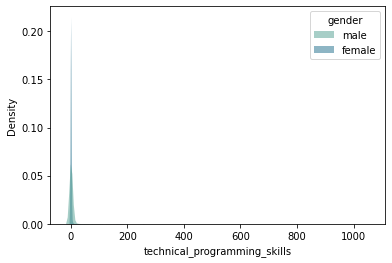

In [ ]:
sns.kdeplot(
   data=skills_cat_df, x="technical_programming_skills", hue="gender",
   fill=True, common_norm=False, palette="crest",
   alpha=.5, linewidth=0,
)

In [ ]:
skill_cat_df.groupby('gender')

In [ ]:
job_gend_count['occupation_gender_ratio'] = job_gend_count.groupby(['search_query'])['count'].transform(lambda x: x/x.sum())

fig = px.bar(job_gend_count, x="search_query", y="occupation_gender_ratio", 
             color="gender", color_discrete_sequence=["blue", "purple"], 
             text_auto=True,
             category_orders={"gender": ["male", "female"]},
             labels={"search_query":'Occupation',
             "occupation_gender_ratio":'Percentage of occupation'})

fig.layout.yaxis.tickformat = ',.0%'

fig.show()

Index(['search_query', 'name', 'gender', 'join_date_from_earliest',
       'location_size', 'hourly_rate', 'pay_grade', 'avg_rating',
       'num_reviews', 'num_recommendations', 'pct_jobs_completed',
       'pct_on_budget', 'pct_on_time', 'verification_preferred_freelancer',
       'verification_identity_verified', 'verification_payment_verified',
       'verification_phone_verified', 'verification_email_verified',
       'verification_facebook_connected', 'badge_plus_membership',
       'badge_preferred_freelancer', 'badge_verified', 'engineering_skills',
       'writing_skills', 'technical_programming_skills',
       'language_translation_skills', 'finance_accounting_skills',
       'management_skills', 'marketing_business_skills',
       'performance_arts_skills', 'design_skills', 'teaching_training_skills',
       'miscellaneous_skills', 'language_certifications',
       'freelancer_certifications', 'general_skill_certifications',
       'programming_certifications'],
      dtype=

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=acc27b92-84be-4130-8026-204943f38189' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>